In [16]:
%load_ext autoreload
%autoreload 2

## imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import audioread

## define test audio files

In [2]:
import soundfile as sf

filename = librosa.ex('trumpet')
print(type(filename))

f0='/Users/athon/Documents/speech_recordings/abc_news_2_speakers.mp3'
f1='/Users/athon/Documents/speech_recordings/lex_tegmark_2_speakers.mp3'
f2='/Users/athon/Documents/speech_recordings/bigthink_4_speakers.mp3'
f3='/Users/athon/Documents/speech_recordings/qanda_covid_5_speakers.mp3'
f4='/Users/athon/Documents/speech_recordings/harris_affleck_5_speakers.mp3'
f5='/Users/athon/Documents/speech_recordings/bigthink_intro_10_speakers.mp3'


<class 'str'>


## load chosen file and visualise spectrogram

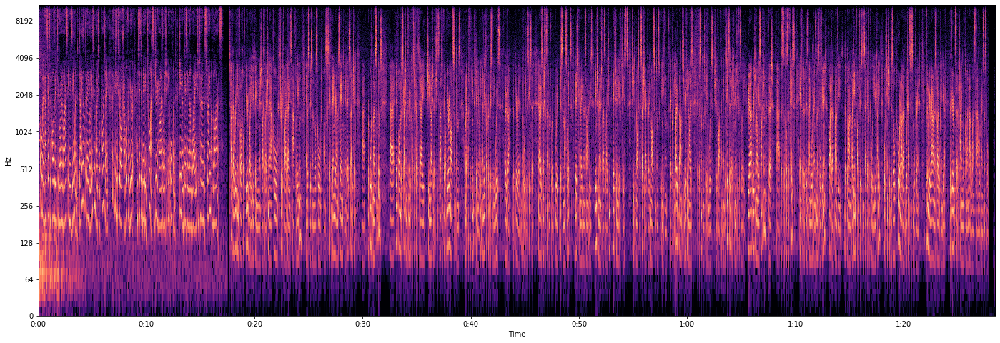

In [3]:
audio = f0
    
y, sr = librosa.load(audio)

# Trim any slience from start or finish of recording
y, index = librosa.effects.trim(y)

# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))

# Plot a 5 second slice of the spectrogram
# idx = slice(*librosa.time_to_frames([10, 15], sr=sr))
fig, ax = plt.subplots(figsize=[24,8])
img = librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max), y_axis='log', x_axis='time', sr=sr, ax=ax)

In [4]:
y.shape

(1951232,)

## Extract PASE embedding from pretrained `PASE+` checkpoint file

In [6]:
from pase.models.frontend import wf_builder
pase = wf_builder('cfg/PASE+.cfg').eval()
pase.load_pretrained('models/FE_e199.ckpt', load_last=True, verbose=True)

# Now we can forward waveforms as Torch tensors
import torch
# 
# eg 100000 samples / 16kHz sample rate = 6.25 seconds
# Frame stride 10ms leads to 625 frames over 6.25 second period
# y size will be (1, 256, 625), which are 625 frames of 256 dims each
y_pase = pase(torch.from_numpy(y).view(1,1,-1))

Current Model keys:  78
Current Pt keys:  78
Loading matching keys:  ['denseskips.0.weight', 'denseskips.1.weight', 'denseskips.2.weight', 'denseskips.3.weight', 'denseskips.4.weight', 'denseskips.5.weight', 'denseskips.6.weight', 'blocks.0.conv.low_hz_', 'blocks.0.conv.band_hz_', 'blocks.0.norm.weight', 'blocks.0.norm.bias', 'blocks.0.norm.running_mean', 'blocks.0.norm.running_var', 'blocks.0.norm.num_batches_tracked', 'blocks.0.act.weight', 'blocks.1.conv.weight', 'blocks.1.conv.bias', 'blocks.1.norm.weight', 'blocks.1.norm.bias', 'blocks.1.norm.running_mean', 'blocks.1.norm.running_var', 'blocks.1.norm.num_batches_tracked', 'blocks.1.act.weight', 'blocks.2.conv.weight', 'blocks.2.conv.bias', 'blocks.2.norm.weight', 'blocks.2.norm.bias', 'blocks.2.norm.running_mean', 'blocks.2.norm.running_var', 'blocks.2.norm.num_batches_tracked', 'blocks.2.act.weight', 'blocks.3.conv.weight', 'blocks.3.conv.bias', 'blocks.3.norm.weight', 'blocks.3.norm.bias', 'blocks.3.norm.running_mean', 'blocks.3

## dimensionality reduction

In [7]:
from utils.manifold import summary
import pandas as pd

algos = ['PCA', 'tSNE', 'UMAP']

df_emb = pd.DataFrame(y_pase.squeeze().detach().T.numpy())

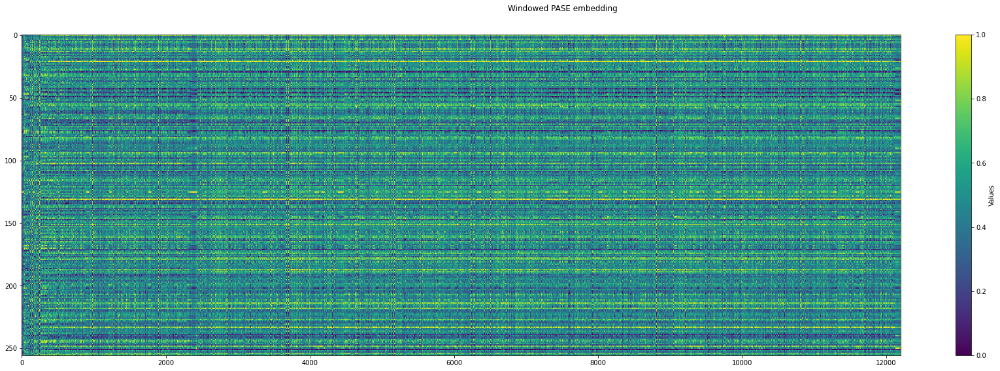

In [8]:
from utils.vis import look
_=df_emb.T.pipe(look, title='Windowed PASE embedding', figsize=[24,8])

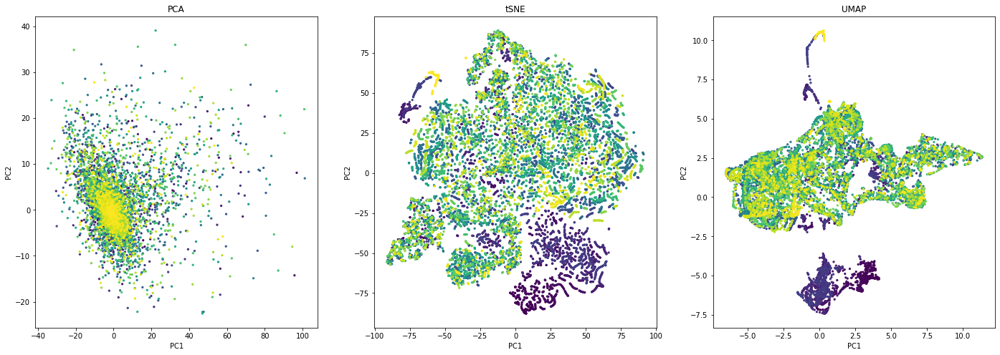

In [29]:
_=summary(df_emb, algos, labels=pd.DataFrame(df_emb.index))

## blow up UMAP

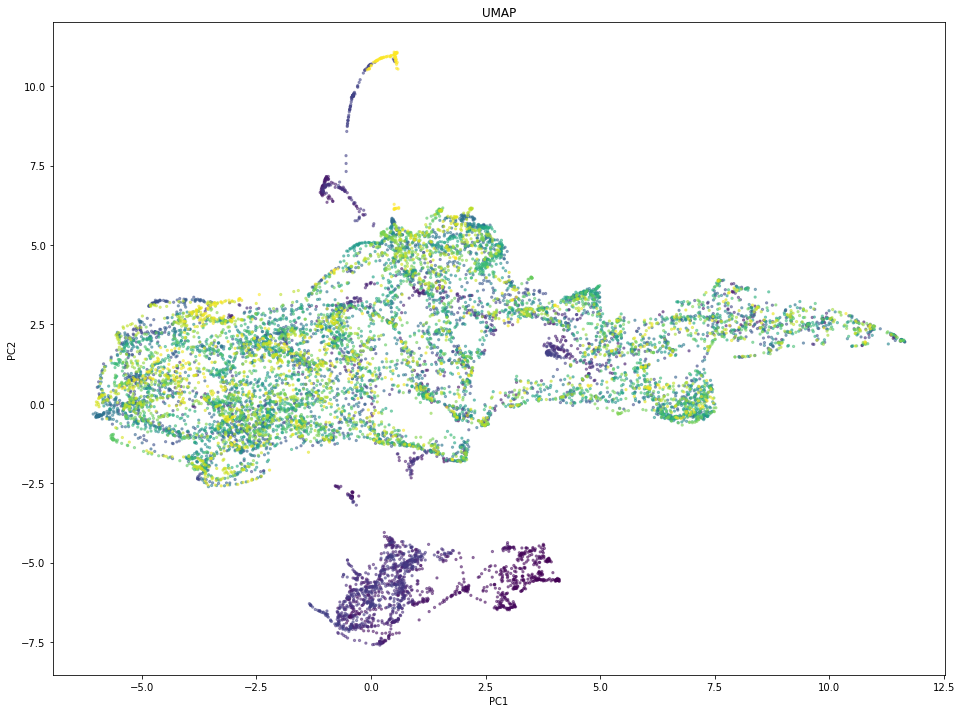

In [36]:
_=summary(df_emb, ["UMAP"], labels=pd.DataFrame(df_emb.index), alpha=0.5, figsize=[16,12])

## train on speaker ID task

In [97]:
import configparser as ConfigParser

cfg_file = 'cfg/SincNet_TIMIT.cfg'
cfgparser = ConfigParser.ConfigParser()
cfgparser.read(cfg_file)

# convert to dict

cfg_dict = {k:v for s in cfgparser.sections() for (k,v) in cfgparser.items(s)}

class dotdict(dict):
    """dot.notation access to dictionary attributes"""
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

options = dotdict(cfg_dict)

In [103]:
from utils.data_io import str_to_bool, ReadList

# [data]
tr_lst = options.tr_lst
te_lst = options.te_lst
pt_file = options.pt_file
class_dict_file = options.lab_dict
data_folder = options.data_folder + "/"
output_folder = options.output_folder

# [windowing]
fs = int(options.fs)
cw_len = int(options.cw_len)
cw_shift = int(options.cw_shift)

# [cnn]
cnn_N_filt = list(map(int, options.cnn_n_filt.split(",")))
cnn_len_filt = list(map(int, options.cnn_len_filt.split(",")))
cnn_max_pool_len = list(map(int, options.cnn_max_pool_len.split(",")))
cnn_use_laynorm_inp = str_to_bool(options.cnn_use_laynorm_inp)
cnn_use_batchnorm_inp = str_to_bool(options.cnn_use_batchnorm_inp)
cnn_use_laynorm = list(map(str_to_bool, options.cnn_use_laynorm.split(",")))
cnn_use_batchnorm = list(map(str_to_bool, options.cnn_use_batchnorm.split(",")))
cnn_act = list(map(str, options.cnn_act.split(",")))
cnn_drop = list(map(float, options.cnn_drop.split(",")))


# [dnn]
fc_lay = list(map(int, options.fc_lay.split(",")))
fc_drop = list(map(float, options.fc_drop.split(",")))
fc_use_laynorm_inp = str_to_bool(options.fc_use_laynorm_inp)
fc_use_batchnorm_inp = str_to_bool(options.fc_use_batchnorm_inp)
fc_use_batchnorm = list(map(str_to_bool, options.fc_use_batchnorm.split(",")))
fc_use_laynorm = list(map(str_to_bool, options.fc_use_laynorm.split(",")))
fc_act = list(map(str, options.fc_act.split(",")))

# [class]
class_lay = list(map(int, options.class_lay.split(",")))
class_drop = list(map(float, options.class_drop.split(",")))
class_use_laynorm_inp = str_to_bool(options.class_use_laynorm_inp)
class_use_batchnorm_inp = str_to_bool(options.class_use_batchnorm_inp)
class_use_batchnorm = list(map(str_to_bool, options.class_use_batchnorm.split(",")))
class_use_laynorm = list(map(str_to_bool, options.class_use_laynorm.split(",")))
class_act = list(map(str, options.class_act.split(",")))


# [optimization]
lr = float(options.lr)
batch_size = int(options.batch_size)
N_epochs = int(options.n_epochs)
N_batches = int(options.n_batches)
N_eval_epoch = int(options.n_eval_epoch)
seed = int(options.seed)

In [105]:
from dnn_models import MLP, flip
from dnn_models import SincNet as CNN

# # training list
# wav_lst_tr = ReadList(tr_lst)
# snt_tr = len(wav_lst_tr)

# # test list
# wav_lst_te = ReadList(te_lst)
# snt_te = len(wav_lst_te)


# Folder creation
# try:
#     os.stat(output_folder)
# except:
#     os.mkdir(output_folder)


# setting seed
torch.manual_seed(seed)
np.random.seed(seed)

# loss function
cost = nn.NLLLoss()


# Converting context and shift in samples
wlen = int(fs * cw_len / 1000.00)
wshift = int(fs * cw_shift / 1000.00)

# Batch_dev
Batch_dev = 128


# Feature extractor CNN
CNN_arch = {
    "input_dim": wlen,
    "fs": fs,
    "cnn_N_filt": cnn_N_filt,
    "cnn_len_filt": cnn_len_filt,
    "cnn_max_pool_len": cnn_max_pool_len,
    "cnn_use_laynorm_inp": cnn_use_laynorm_inp,
    "cnn_use_batchnorm_inp": cnn_use_batchnorm_inp,
    "cnn_use_laynorm": cnn_use_laynorm,
    "cnn_use_batchnorm": cnn_use_batchnorm,
    "cnn_act": cnn_act,
    "cnn_drop": cnn_drop,
}

CNN_net = CNN(CNN_arch)
# CNN_net.cuda()

# Loading label dictionary
lab_dict = np.load(class_dict_file, allow_pickle=True).item()


DNN1_arch = {
    "input_dim": CNN_net.out_dim,
    "fc_lay": fc_lay,
    "fc_drop": fc_drop,
    "fc_use_batchnorm": fc_use_batchnorm,
    "fc_use_laynorm": fc_use_laynorm,
    "fc_use_laynorm_inp": fc_use_laynorm_inp,
    "fc_use_batchnorm_inp": fc_use_batchnorm_inp,
    "fc_act": fc_act,
}

DNN1_net = MLP(DNN1_arch)
# DNN1_net.cuda()


DNN2_arch = {
    "input_dim": fc_lay[-1],
    "fc_lay": class_lay,
    "fc_drop": class_drop,
    "fc_use_batchnorm": class_use_batchnorm,
    "fc_use_laynorm": class_use_laynorm,
    "fc_use_laynorm_inp": class_use_laynorm_inp,
    "fc_use_batchnorm_inp": class_use_batchnorm_inp,
    "fc_act": class_act,
}


DNN2_net = MLP(DNN2_arch)
# DNN2_net.cuda()

NameError: name 'CNN' is not defined

In [38]:
pt_file = "models/model_raw.pkl"
checkpoint_load = torch.load(pt_file, map_location=torch.device('cpu'))
CNN_net.load_state_dict(checkpoint_load["CNN_model_par"])
DNN1_net.load_state_dict(checkpoint_load["DNN1_model_par"])
DNN2_net.load_state_dict(checkpoint_load["DNN2_model_par"])

NameError: name 'CNN_net' is not defined